<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "title"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">&#8759; Keratoconus Eye Disease Detection Using Deep Learning
    </h1>
</div>

<img src="https://cdn.newsapi.com.au/image/v1/7e54f7615b365cadd594815925b86a14?width=1280" alt="Facial Recognition And Emotion Detection Model" style="width:100%;height:400px;">

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "import-libraries"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Import Standard Libraries
    </h1>
</div>

In [8]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as npy # linear algebra
import pandas as pds # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen


In [9]:
# Read all files from folders
# for dirname, _, filenames in os.walk(KAGGLE):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [14]:
# Specify important directories
import os, sys, time, warnings, sklearn
ROOT='/kaggle/input'
# ROOT='data'
TRAIN_PATH=ROOT+'/keratoconus-detection/Train_Validation sets/Train_Validation sets'
TEST_PATH=ROOT+'/keratoconus-detection/Independent Test Set/Independent Test Set'
train_kcn_img_path=TRAIN_PATH +'/Keratoconus'

MODEL_PATH='models'
IMAGE_PATH='images'
MOD_DATA='mod_data'

OVERSAMPLED_TRAIN_PATH=MOD_DATA+'/fed_oversampled/train'
OVERSAMPLED_VALID_PATH=MOD_DATA+'/fed_oversampled/valid'

# Model Architecture path
def model_arch(model_name):
    !mkdir (images)
    arch=IMAGE_PATH+'/keratoconus_'+model_name+'.png'
    return arch

#  TensorFlow Checkpoint save_weight uses .ckpt extension format
def checkpoint_path(model_name):
    # !mkdir models
    checkpoint_path = MODEL_PATH+"/keratoconus_best_model-"+model_name+".ckpt"
    return checkpoint_path

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "exploratory-da"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Exploratory Data Analysis
    </h1>
</div>

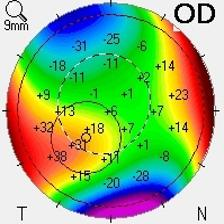

In [15]:
# Load a sample image 
# using open() to open images
image_data=Image.open(train_kcn_img_path+'/case1/KCN_1_EC_A.jpg')
image_data

Image shape: (224, 224, 3)
Image data array: [[[238 238 238]
  [250 250 250]
  [235 235 235]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[246 246 246]
  [236 236 236]
  [242 242 242]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[229 229 229]
  [255 255 255]
  [236 236 236]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 ...

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]

 [[240 240 240]
  [240 240 240]
  [240 240 240]
  ...
  [240 240 240]
  [240 240 240]
  [240 240 240]]]
Image array shape: (224, 224, 3)


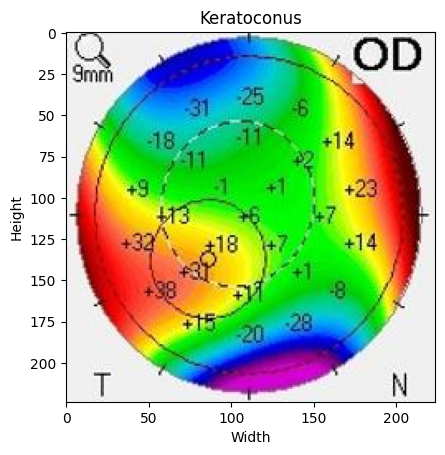

In [16]:
# Get the shape of the image
image=plt.imread(train_kcn_img_path+'/case1/KCN_1_EC_A.jpg')
print(f'Image shape: {image.shape}')

# Convert image data (like jpeg) to numpy using asarray()
image_array = npy.asarray(image_data)
print(f'Image data array: {image_array}')

# Get the shape of the image array
print(f'Image array shape: {image_array.shape}')

# Printing the image 
plt.imshow(image_array)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Keratoconus')
plt.show()

In [17]:
# Get the list of folders in the directory as classes
class_dir=os.listdir(TRAIN_PATH+'/')
class_dir

['Keratoconus', 'Normal', 'Suspect']

In [18]:
# Get dictionary list of image count per class
def class_sample(type):
    if type.lower() == 'test' or type.lower() == 'train':
        path=''
        if type.lower() == 'train':    
            path= TRAIN_PATH
        else:
            path= TEST_PATH
        
        filepath=path+'/'
        class_count = []
        class_dict ={}
        for folder in os.listdir(filepath) :
              class_dict[folder] = sum([len(files) for r, d, files in os.walk(filepath+folder)])
              class_count.append(sum([len(files) for r, d, files in os.walk(filepath+folder)]))
        class_total = sum(class_count)
        return class_total, class_count, class_dict
    else:
        raise ValueError('Invalid type. Must be "test" or "train".')


def test_train_distribution():
      print("---- Train Set ----")
      avg_train=class_sample('train')[0]/len(class_sample('train')[1])
      print(f'Train class distribution:\n{class_sample("train")[2]}')
      print("Average train class: ",round(avg_train))    
      print('Total train: ', class_sample('train')[0])

      print("\n---- Test Set ----")
      avg_test=class_sample('test')[0]/len(class_sample('test')[1])
      print(f'Test class distribution:\n{class_sample("test")[2]}')
      print("Average test class: ",round(avg_test)) 
      print('Total test: ', class_sample('test')[0])


test_train_distribution()

# test_samples=class_sample('test')[0]
# test_batch_size=sorted([int(test_samples/n) for n in range(1,test_samples+1) if test_samples % n ==0 and test_samples/n<=80],reverse=True)[0]  


---- Train Set ----
Train class distribution:
{'Keratoconus': 1050, 'Normal': 1050, 'Suspect': 861}
Average train class:  987
Total train:  2961

---- Test Set ----
Test class distribution:
{'Keratoconus': 350, 'Normal': 350, 'Suspect': 350}
Average test class:  350
Total test:  1050


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "data-visualization"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Data Visualization
    </h1>
</div>

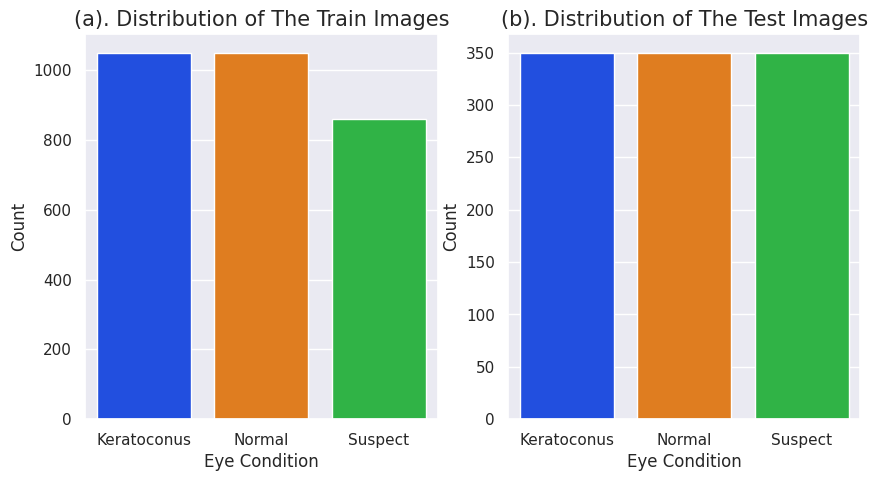

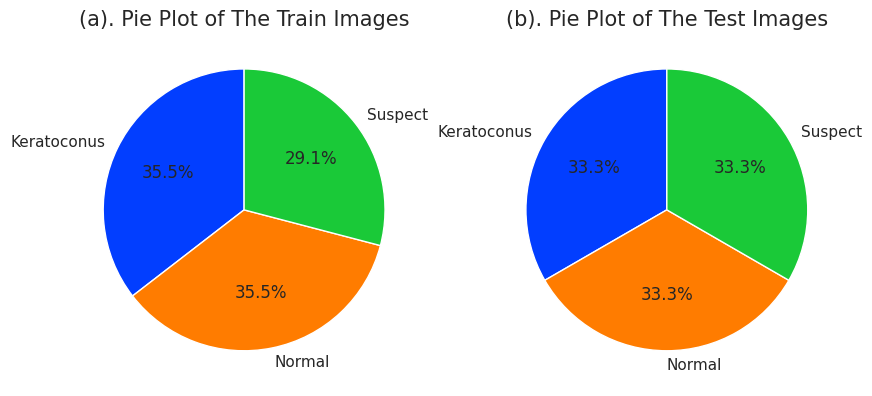

In [19]:
df_train = pds.DataFrame(list(class_sample("train")[2].items()), columns=['Condition', 'Count'])
df_train.index.name = 'Condition'
df_test = pds.DataFrame(list(class_sample("test")[2].items()), columns=['Condition', 'Count'])
df_test.index.name = 'Condition'


# plot a barplot with vertical orientation
sns.set()
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
axis = sns.barplot(x='Condition', y='Count', data=df_train, orient='v', palette='bright')
# set labels and title
plt.xlabel("Eye Condition", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("(a). Distribution of The Train Images", fontsize=15)
# plt.legend( df_train.Emotion, loc='upper left')
# set x-axis tick labels
# axis.set_xticks(range(len(df_train.Emotion)), df_train.Emotion)
# axis.yaxis.set_major_locator(ticker.MultipleLocator(2.5))

plt.subplot(1, 2, 2)
sns.barplot(x='Condition', y='Count', data=df_test, orient='v', palette='bright')
plt.xlabel("Eye Condition", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("(b). Distribution of The Test Images", fontsize=15)
plt.show()

print('\n\n')

x_train = npy.array([ len(os.listdir(TRAIN_PATH+'/'+class_name+'/')) for class_name in class_dir])
x_test = npy.array([ len(os.listdir(TEST_PATH+'/'+class_name+'/')) for class_name in class_dir])
label = class_dir
  
# plot a Pie plot with vertical orientation
plt.figure(figsize=(10, 5))
ax = plt.subplot(1, 2, 1)
# define Seaborn color palette to use
palette_color = sns.color_palette('bright')
plt.pie(x_train, labels=label,colors=palette_color, autopct='%1.1f%%', startangle=90)
ax.set_title('(a). Pie Plot of The Train Images', fontsize=15)

ay = plt.subplot(1, 2, 2)
plt.pie(x_test, labels=label, colors=palette_color, autopct='%1.1f%%', startangle=90)
ay.set_title('(b). Pie Plot of The Test Images', fontsize=15)
plt.show()



In [21]:
target_size=(224, 224)
batch_size=32

## Train Image Data Generator instance. 
# We will not apply any transformon specific orientations or features and no initial rescale to the image
# We'll only split the image data into train and validation set
trainValidation_data_generator = ImgDataGen(
                                            #rescale=1./225,
                                            rotation_range=10,  # Randomly rotate images by up to 10 degrees
                                            zoom_range=0.2,  # Randomly zoom images by up to 20%
                                            width_shift_range=0.1,  # Randomly shift images horizontally by up to 10% of the image width
                                            height_shift_range=0.1,  # Randomly shift images vertically by up to 10% of the image height
                                            shear_range=0.2,  # Randomly apply shearing transformations
                                            horizontal_flip=True,  # Randomly flip images horizontally
                                            fill_mode='nearest',  # Fill in missing pixels with the nearest value
#                                             preprocessing_function=grayscale_RGB_and_upsizing,
                                            validation_split=0.2    # set the validation split                                
                                            )

# Test Image Data Generator instance for Test data
test_data_generator = ImgDataGen()

# Set a random seed to synchronize the shuffle order across different runs of the generator
# trainValidation_data_generator.set_seed(42)


In [47]:
# Successfully mapped the train-images to their classes from the dataframe. Now let's do the same for the test-images. 
# Here, I will only be rescaling. No other transformations are applies, to preserve originality of the images.


## Mapping images to their classes.
print('Train Set Generated - ',end=' ') 
train_generator = trainValidation_data_generator.flow_from_directory(
                                                            directory=TRAIN_PATH, 
                                                            target_size=target_size,
                                                            batch_size=batch_size,
                                                            class_mode='categorical', 
                                                            color_mode='rgb', 
                                                            shuffle=True, 
                                                            subset='training' # set as training data
                                                            # seed=1,
                                                        )
## Mapping images to their classes.
print('Validation Set Generated - ',end=' ') 
validation_generator = trainValidation_data_generator.flow_from_directory(
                                                            directory=TRAIN_PATH, 
                                                            target_size=target_size,
                                                            batch_size=batch_size,
                                                            class_mode='categorical', 
                                                            color_mode='rgb', 
                                                            shuffle=False, 
                                                            subset='validation' # set as validation data
                                                            # seed=1,
                                                        )
test_samples=class_sample('test')[0]
test_batch_size=batch_size
test_steps=int(test_samples/test_batch_size)

## Mapping images to their classes.
print('Test Set Generated - ',end=' ') 
test_generator = test_data_generator.flow_from_directory(
                                        TEST_PATH, 
                                        target_size=target_size,
                                        class_mode='categorical', 
                                        color_mode='rgb', 
                                        shuffle=False, 
                                        # seed=1,
                                        batch_size=batch_size
                                        )


Train Set Generated -  Found 2369 images belonging to 3 classes.
Validation Set Generated -  Found 592 images belonging to 3 classes.
Test Set Generated -  Found 1050 images belonging to 3 classes.


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "more-on-data-analysis"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">More on Data Analysis
     </h1>
</div>

In [49]:
# From the generator we can get information we will need later
# classes=class_dir
class_dictionary = train_generator.class_indices
class_keys = list(train_generator.class_indices.keys())
class_values = list(train_generator.class_indices.values())
class_count = len(class_keys)
classes = class_keys

print ('test batch size: ' ,test_batch_size, '  test steps: ', test_steps, ' number of classes : ', class_count)

train_images, train_labels = next(train_generator)
validation_images, validation_labels = next(validation_generator)
test_images, test_labels = next(test_generator)


print('The 3 identified classes are: ',class_keys)
print(f'The class dictionary are: {class_dictionary}')
print('Class count: ', class_count)

print('\nX_train shape: ', train_images.shape)
print('y_train shape: ', train_labels.shape)

print('\nX_test shape: ', test_images.shape)
print('y_test shape: ', test_labels.shape)


test batch size:  32   test steps:  32  number of classes :  3
The 3 identified classes are:  ['Keratoconus', 'Normal', 'Suspect']
The class dictionary are: {'Keratoconus': 0, 'Normal': 1, 'Suspect': 2}
Class count:  3

X_train shape:  (32, 224, 224, 3)
y_train shape:  (32, 3)

X_test shape:  (32, 224, 224, 3)
y_test shape:  (32, 3)


In [24]:
class_indices = train_generator.class_indices
class_counts = {class_name: 0 for class_name in class_indices}
num_images = train_generator.samples

batch_size = train_generator.batch_size
num_batches = len(train_generator)

for i in range(num_batches):
    batch = next(train_generator)
    images, labels = batch
    for j in range(len(labels)):
        label = npy.argmax(labels[j])  # convert one-hot encoding to integer label
        class_name = list(class_indices.keys())[list(class_indices.values()).index(label)]
        class_counts[class_name] += 1

print(class_counts)
print(f"Total number of images in train generator: {num_images}")

{'Keratoconus': 842, 'Normal': 835, 'Suspect': 692}
Total number of images in train generator: 2369


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "more-on-data-visualization"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">More on Data Visualization
    </h1>
</div>

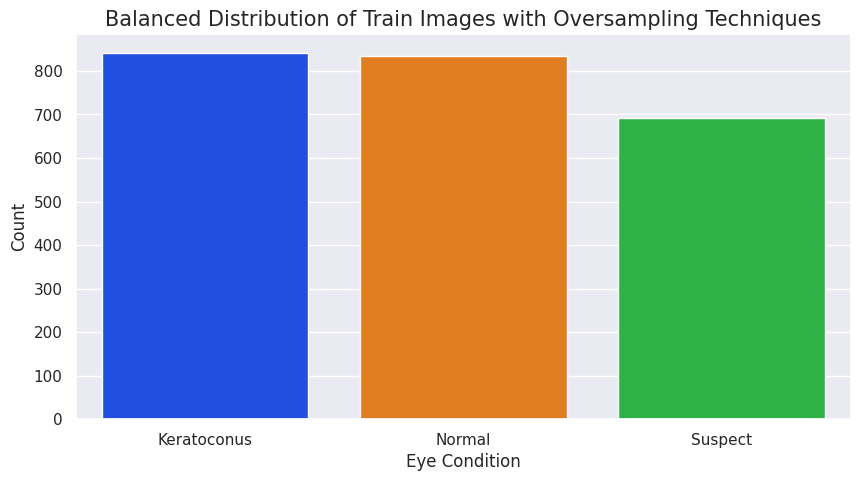

In [25]:
df_train_gen = pds.DataFrame(list(class_counts.items()), columns=['Condition', 'Count'])
df_train_gen.index.name = 'Condition'


# plot a barplot with vertical orientation
sns.set()
plt.figure(figsize=(10, 5))
sns.barplot(x='Condition', y='Count', data=df_train_gen, orient='v', palette='bright')
plt.xlabel("Eye Condition", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Balanced Distribution of Train Images with Oversampling Techniques", fontsize=15)
plt.show()

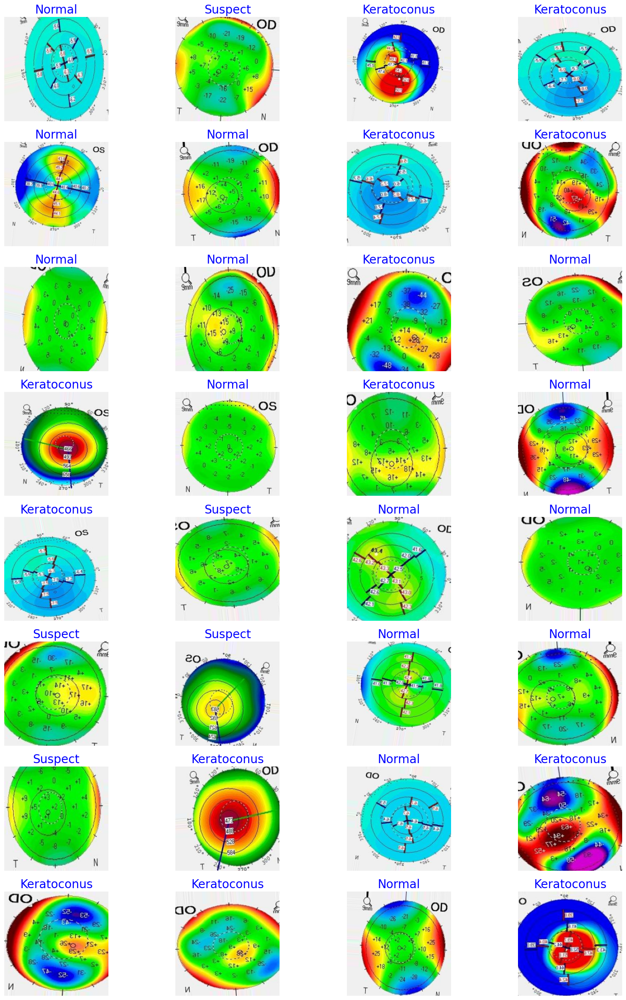

In [26]:
# Get the sample images, labels, and their filenames 
# To get the correct filename, turn off the shuffle
def plotImageWithNames(gen):
    images, labels = next(gen)
    filenames = gen.filenames
    classes = list(gen.class_indices.keys())
    
    plt.figure(figsize=(20, 30))
    length=len(labels)
    if length<32:  
        r=length
    else:
        r=32
    for i in range(r):        
        plt.subplot(8, 4, i + 1)
        image=images[i]/255 
        plt.imshow(image)
        index=npy.argmax(labels[i])
        class_name=classes[index]
        filename=gen.filenames[i]
        plt.title(
                    label=f"{class_name}", # "\n{filename} ", 
                    color='blue', 
                    fontsize=20
        )
        plt.axis('off')
    plt.show()

plotImageWithNames(train_generator)

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-development"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Development
    </h1>
</div>

In [27]:
from tensorflow import keras
from sklearn import set_config
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen
from tensorflow.keras.layers import Flatten, Dense, Dropout, Conv2D, MaxPooling2D, Activation, BatchNormalization
from tensorflow.keras.models import Sequential, load_model

from tensorflow.keras import layers, optimizers, metrics, regularizers, models
from tensorflow.keras.optimizers import Adam, Adamax
# from tensorflow.keras.metrics import categorical_crossentropy, sparse_categorical_crossentropy


In [28]:
# define the image shape for the input layer
input_shape=(target_size[0], target_size[1], 3)
batch_size = batch_size
epochs=60
ask_epoch=15

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-building-and-compiling"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Building and Compiling
    </h1>
</div>

In [29]:
import tensorflow as tf
from tensorflow.keras.models import Model
model_name='EfficientNetB4'
base_model=tf.keras.applications.efficientnet.EfficientNetB4(
                                                            include_top=False, 
                                                            weights="imagenet",
                                                            input_shape=input_shape, 
                                                            pooling='max'
                                                            ) 

# Let's make our base_model trainable to get better results
base_model.trainable=True
x=base_model.output

x=BatchNormalization(
                    axis=-1, 
                    momentum=0.99, 
                    epsilon=0.001,
                    name='batch_norm_x' 
                    )(x)
x = Dense(
          512, 
          kernel_regularizer = regularizers.l2(l = 0.016),
          activity_regularizer=regularizers.l1(0.006),
          bias_regularizer=regularizers.l1(0.006),
          activation='relu',
          name='dense_x'
          )(x)

x=Dropout(
          rate=0.4, 
          seed=123,
          name='dropout_x'
          )(x) 
      
output=Dense(
            class_count, 
            activation='softmax',
            name='dense_output'
            )(x)
cnn_model=Model(inputs=base_model.input, outputs=output, name=model_name)
learning_rate=.001 # start with this learning rate
cnn_model.compile(
                  Adamax(learning_rate=learning_rate), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy']
                  )

# View the model summary
cnn_model.summary()

71686520/71686520 [==============================] - 3s 0us/step
Model: "EfficientNetB4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescal

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "create-a-custom-keras-callback-to-continue-or-halt-training"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;"> Create a Custom Keras Callback to Continue or Halt Training
    </h1>
</div>

In [32]:
# Code by https://www.kaggle.com/code/gpiosenka/callback-to-continue-or-halt-training-f1-90
class ASK(keras.callbacks.Callback):
    def __init__ (self, model, epochs,  ask_epoch): # initialization of the callback
        super(ASK, self).__init__()
        self.model=model               
        self.ask_epoch=ask_epoch
        self.subask_epoch = int(ask_epoch/2)
        self.epochs=epochs
        self.ask=True # if True query the user on a specified epoch
        
    def on_train_begin(self, logs=None): # this runs on the beginning of training
        if self.ask_epoch == 0: 
            print('you set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch=1
        if self.ask_epoch >= self.epochs: # you are running for epochs but ask_epoch>epochs
            print('ask_epoch >= epochs, will train for ', epochs, ' epochs', flush=True)
            self.ask=False # do not query the user
        if self.epochs == 1:
            self.ask=False # running only for 1 epoch so do not query user
        else:
            print('Training will proceed until epoch', ask_epoch,' then you will be asked to') 
            print(' enter H to halt training or enter an integer for how many more epochs to run then be asked again')  
        self.start_time= time.time() # set the time at which training started
        
    def on_train_end(self, logs=None):   # runs at the end of training     
        tr_duration=time.time() - self.start_time   # determine how long the training cycle lasted         
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print (msg, flush=True) # print out training duration time
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        
        if self.ask: # are the conditions right to query the user?
            if epoch + 1 ==self.ask_epoch: # is this epoch the one for quering the user?
                print('\n Enter H to end training or  an integer for the number of additional epochs to run then ask again')
                ans=input()
                
                if ans == 'H' or ans =='h' or ans == '0': # quit training for these conditions
                    print ('you entered ', ans, ' Training halted on epoch ', epoch+1, ' due to user input\n', flush=True)
                    self.model.stop_training = True # halt training
                else: # user wants to continue training
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.epochs:
                        print('\nYou earlier specified a maximum epochs of ', self.epochs, '\n, its seems that you want to train for a total of', self.ask_epoch,'\n\n Please confirm your action, please enter "Y", or "N" to end training at ', self.epochs)
                        ans=input()
                        
                        if ans == 'Y' or ans =='y':
                            self.epochs = self.ask_epoch
                        else:
                             print('\nYou specified maximum epochs of as ', self.epochs, ' cannot train for ', self.ask_epoch, flush =True)
                    else:
                        print ('you entered ', ans, ' Training will continue to epoch ', self.ask_epoch, flush=True)
                        
ask=ASK(cnn_model, epochs,  ask_epoch)

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "checkpoint-callback"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Checkpoint Callback
    </h1>
</div>

In [33]:
#  starting the Checkpoint for the model
# checkpoint_dir = os.path.dirname(checkpoint_path)

check_point = tf.keras.callbacks.ModelCheckpoint(
                                          filepath=checkpoint_path(model_name),
                                          save_weights_only=True,
                                          save_best_only=True, 
                                          monitor="val_accuracy",
                                          verbose = 1,
                                            )

reduce_learning = tf.keras.callbacks.ReduceLROnPlateau(
                                            monitor="val_accuracy", 
                                            # factor=0.5, 
                                            patience=2,
                                            verbose=1
                                            )

early_stop = tf.keras.callbacks.EarlyStopping(
                                       monitor="val_accuracy", 
                                       min_delta=0.0005,
                                       patience=11, 
                                       verbose=1,
                                       restore_best_weights=True
                                       )

callbacks = [
            check_point,
            reduce_learning, 
            early_stop, 
            ask
          ]

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-training"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Training
    </h1>
</div>

In [34]:
 model_history=cnn_model.fit(
                  train_generator,  
                  steps_per_epoch=train_generator.n//train_generator.batch_size,
                  epochs=epochs, 
                  verbose=1, 
                  callbacks=callbacks,  
                  validation_data=validation_generator,
                  validation_steps= validation_generator.n//validation_generator.batch_size,
                  )


Training will proceed until epoch 15  then you will be asked to
 enter H to halt training or enter an integer for how many more epochs to run then be asked again
Epoch 1/60


2023-05-04 20:36:43.045793: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inEfficientNetB4/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


74/74 [==============================] - ETA: 0s - loss: 13.3473 - accuracy: 0.5528
Epoch 1: val_accuracy improved from -inf to 0.66667, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
74/74 [==============================] - 126s 748ms/step - loss: 13.3473 - accuracy: 0.5528 - val_loss: 11.6025 - val_accuracy: 0.6667 - lr: 0.0010
Epoch 2/60
74/74 [==============================] - ETA: 0s - loss: 9.4368 - accuracy: 0.6453
Epoch 2: val_accuracy improved from 0.66667 to 0.76562, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
74/74 [==============================] - 48s 642ms/step - loss: 9.4368 - accuracy: 0.6453 - val_loss: 8.3238 - val_accuracy: 0.7656 - lr: 0.0010
Epoch 3/60
74/74 [==============================] - ETA: 0s - loss: 7.1420 - accuracy: 0.6898
Epoch 3: val_accuracy improved from 0.76562 to 0.80729, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
74/74 [==============================] - 51s 690ms/step - loss: 7.1420 -

 5


you entered  5  Training will continue to epoch  20
74/74 [==============================] - 173s 2s/step - loss: 3.4578 - accuracy: 0.7976 - val_loss: 3.4198 - val_accuracy: 0.8090 - lr: 1.0000e-07
Epoch 16/60
74/74 [==============================] - ETA: 0s - loss: 3.4603 - accuracy: 0.7809
Epoch 16: val_accuracy improved from 0.83160 to 0.83333, saving model to models/keratoconus_best_model-EfficientNetB4.ckpt
74/74 [==============================] - 52s 695ms/step - loss: 3.4603 - accuracy: 0.7809 - val_loss: 3.4164 - val_accuracy: 0.8333 - lr: 1.0000e-07
Epoch 17/60
74/74 [==============================] - ETA: 0s - loss: 3.4729 - accuracy: 0.7869
Epoch 17: val_accuracy did not improve from 0.83333
74/74 [==============================] - 48s 651ms/step - loss: 3.4729 - accuracy: 0.7869 - val_loss: 3.4148 - val_accuracy: 0.8264 - lr: 1.0000e-07
Epoch 18/60
74/74 [==============================] - ETA: 0s - loss: 3.4593 - accuracy: 0.7818
Epoch 18: val_accuracy did not improve from

 10


you entered  10  Training will continue to epoch  30
74/74 [==============================] - 96s 1s/step - loss: 3.4475 - accuracy: 0.7935 - val_loss: 3.4308 - val_accuracy: 0.8038 - lr: 1.0000e-08
Epoch 21/60
74/74 [==============================] - ETA: 0s - loss: 3.4647 - accuracy: 0.7728
Epoch 21: val_accuracy did not improve from 0.83333
74/74 [==============================] - 45s 611ms/step - loss: 3.4647 - accuracy: 0.7728 - val_loss: 3.4233 - val_accuracy: 0.8160 - lr: 1.0000e-09
Epoch 22/60
74/74 [==============================] - ETA: 0s - loss: 3.4592 - accuracy: 0.7908
Epoch 22: val_accuracy did not improve from 0.83333

Epoch 22: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-10.
74/74 [==============================] - 49s 654ms/step - loss: 3.4592 - accuracy: 0.7908 - val_loss: 3.4247 - val_accuracy: 0.8160 - lr: 1.0000e-09
Epoch 23/60
74/74 [==============================] - ETA: 0s - loss: 3.4568 - accuracy: 0.7895
Epoch 23: val_accuracy did not impro

In [35]:

# 75/75 [==============================] - 
# 8s 103ms/step - loss: 0.5500 - accuracy: 0.7294 - val_loss: 0.8655 - val_accuracy: 0.7196 - lr: 1.0000e-09
# Model performed woefully when the training images were augmented
# 39s 524ms/step - loss: 1.0522 - accuracy: 0.4570 - val_loss: 1.0396 - val_accuracy: 0.5069 - lr: 1.0000e-23
# Using transfer learning model Effnet-B4,with train_set set to shuffle while valid_set and test_set set to false
# 74/74 [==============================] - 
# 50s 676ms/step - loss: 2.8592 - accuracy: 0.8117 - val_loss: 2.8813 - val_accuracy: 0.8125 - lr: 1.0000e-09
# Restoring model weights from the end of the best epoch: 9.
# 74/74 [==============================] - 48s 639ms/step - loss: 1.7965 - accuracy: 0.8383 - val_loss: 1.9538 - val_accuracy: 0.7934 - lr: 1.0000e-09

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "acuracy-and-loss-function-graph"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Accuracy and Loss Function Graph
    </h1>
</div>

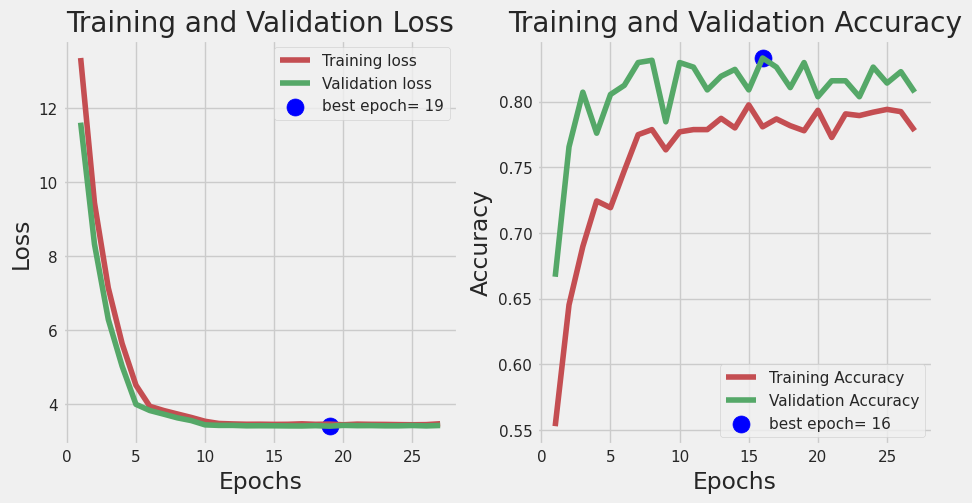

In [36]:
# Code by https://www.kaggle.com/code/gpiosenka/callback-to-continue-or-halt-training-f1-90
def trainValPlot(tr_data, start_epoch):
    # Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)   
    index_loss=npy.argmin(vloss)   #   this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=npy.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout    
    plt.show()
    
trainValPlot(model_history,0)


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "model-evaluation"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Model Evaluation
    </h1>
</div>

In [37]:
# Rebuild a fresh, untrained model and evaluate it on the test set. 
# An untrained model will perform at chance levels (~10% accuracy)
# Create a basic model instance
model = cnn_model

# Evaluate the model
loss, acc = model.evaluate(train_generator, verbose=2)

75/75 - 28s - loss: 3.4024 - accuracy: 0.8075 - 28s/epoch - 376ms/step


In [38]:
# Rebuild a fresh, untrained model and evaluate it on the test set. 
# An untrained model will perform at chance levels (~10% accuracy)
# Create a basic model instance
model = cnn_model

# Evaluate the model
loss, acc = model.evaluate(validation_generator, verbose=2)

19/19 - 7s - loss: 3.4358 - accuracy: 0.8074 - 7s/epoch - 376ms/step


Load the weights from the saved checkpoint and evaluate

In [39]:
# Loads the weights
cnn_model.load_weights(checkpoint_path(model_name=model_name))

# Re-evaluate the model
loss, acc = cnn_model.evaluate(validation_generator, verbose=2)
print("Restored model, validation accuracy: {:5.2f}%".format(100 * acc))

19/19 - 7s - loss: 3.4334 - accuracy: 0.8176 - 7s/epoch - 365ms/step
Restored model, validation accuracy: 81.76%


In [53]:
# Loads the weights
cnn_model.load_weights(checkpoint_path(model_name))

# Re-evaluate the model
loss, acc = cnn_model.evaluate(test_images, test_labels, verbose=2)
print("Restored model, accuracy on New Test data: {:5.2f}%".format(100 * acc))

1/1 - 0s - loss: 3.5039 - accuracy: 0.7188 - 121ms/epoch - 121ms/step
Restored model, accuracy on New Test data: 71.88%


<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "prediction-on-test-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Prediction on Test Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#prediction-on-test-images">¶</a>
    </h1>
</div>

In [52]:
# 
def ModelPredictionOnTestDataset(test_generator, suffix=''):
#     test_steps= test_generator.n//test_generator.batch_size
    y_pred= []
    y_label=test_generator.labels
    classes=list(train_generator.class_indices.keys())
    class_count=len(classes)
    wrong_predictions=0
    
    # predict on the test set
    preds=cnn_model.predict(test_generator, test_steps, verbose=1) 
    
    total_predictions=len(preds)
    print(f'total prediction: {total_predictions}')
    for i, p in enumerate(preds):
            pred_index=npy.argmax(p)  
            # labels are integer values       
            true_index=test_generator.labels[i]  
            if pred_index != true_index:       
                # a misclassification has occurred                                     
                wrong_predictions=wrong_predictions + 1
            y_pred.append(pred_index)
    acc=( 1-wrong_predictions/total_predictions) * 100
    print(f'\n{wrong_predictions} out of {total_predictions} tested images could not be detected properly.\nAccuracy of {acc:6.2f}\n')
    ypred=npy.array(y_pred)
    ytrue=npy.array(y_label)
    if class_count <=30:
        cm = confusion_matrix(ytrue, ypred )
        # plot the confusion matrix
        plt.figure(figsize=(8, 4))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(npy.arange(class_count)+.5, classes, rotation=90)
        plt.yticks(npy.arange(class_count)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix on "+suffix.capitalize()+" Data", fontsize=15)
        plt.show()
    clr = classification_report(y_label, y_pred, target_names=classes, digits= 5) # create classification report
    print(f"Classification Report on {suffix.capitalize()} Data:\n-------------------------------------\n", clr)

    return wrong_predictions, total_predictions


19/19 [==============================] - 10s 381ms/step
total prediction: 592

110 out of 592 tested images could not be detected properly.
Accuracy of  81.42



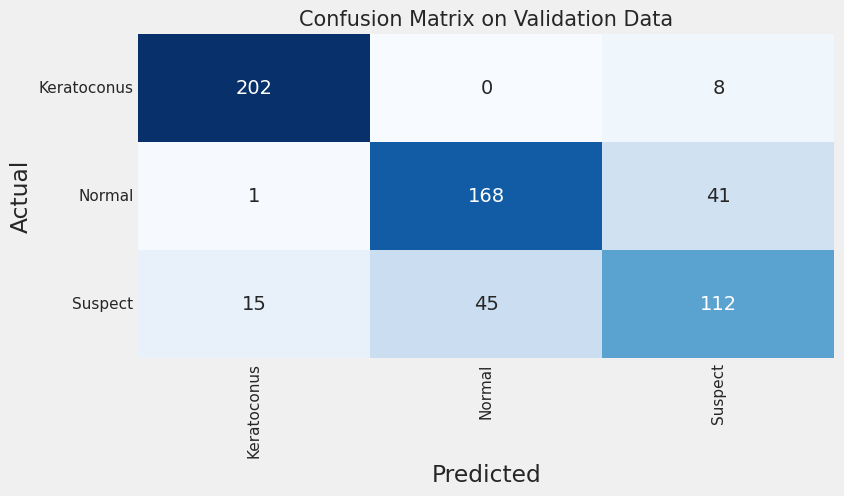

Classification Report on Validation Data:
-------------------------------------
               precision    recall  f1-score   support

 Keratoconus    0.92661   0.96190   0.94393       210
      Normal    0.78873   0.80000   0.79433       210
     Suspect    0.69565   0.65116   0.67267       172

    accuracy                        0.81419       592
   macro avg    0.80366   0.80436   0.80364       592
weighted avg    0.81060   0.81419   0.81205       592



In [42]:
# Prediction on Validation set
wrong_val_predictions, total_val_predictions = ModelPredictionOnTestDataset(validation_generator, suffix = 'validation')

33/33 [==============================] - 3s 92ms/step
total prediction: 1050

440 out of 1050 tested images could not be detected properly.
Accuracy of  58.10



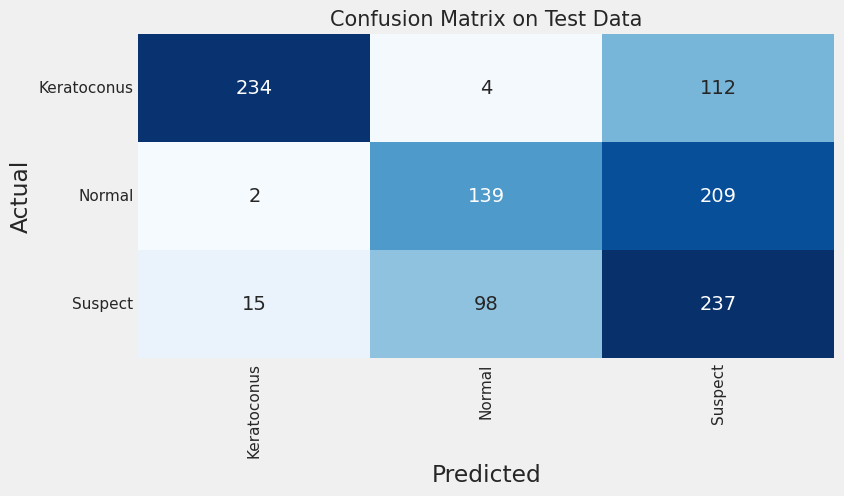

Classification Report on Test Data:
-------------------------------------
               precision    recall  f1-score   support

 Keratoconus    0.93227   0.66857   0.77870       350
      Normal    0.57676   0.39714   0.47039       350
     Suspect    0.42473   0.67714   0.52203       350

    accuracy                        0.58095      1050
   macro avg    0.64459   0.58095   0.59037      1050
weighted avg    0.64459   0.58095   0.59037      1050



In [54]:
# Prediction on the Test set
wrong_test_predictions, total_test_predictions = ModelPredictionOnTestDataset(test_generator, suffix = 'test')

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions">¶</a>
    </h1>
</div>

In [44]:
# 
def compare(label_prep, gen=train_generator):
    class_dictionary = gen.class_indices
    for key, value in class_dictionary.items():
        if value == label_prep:
             return key

def dif(label_test, label_prep, gen=train_generator):    
    class_dictionary = gen.class_indices
    test = ''
    id = ''
    for key, value in class_dictionary.items():
        if value == label_test:
            test = key
        if value == label_prep:
            id = key
    return test, id

# Verify the predicted images Function
def verifyPredictions(gentype = 'test'):
    if gentype.lower() == 'test' or gentype.lower() == 'validation':
        generator = ''
        if gentype.lower() == 'validation':
            generator = validation_generator
        else:
            generator = test_generator
        test_images, test_labels = next(generator)
        preds = cnn_model.predict(test_images)
        # One hot conversion
        label_prep = npy.argmax(preds, axis = 1)
        label_test = npy.argmax(test_labels, axis = 1)
        # Reshape
        label_prep = label_prep.reshape((-1, 1))
        label_test = npy.reshape(label_test, (len(label_test), 1))

        print(f"Batch prediction for {gentype} set: {npy.sum((label_test == label_prep)*1)/test_batch_size}\n")

        # Print the result
        fig = plt.figure(figsize=((20, 30)))
        for j in range(len(label_prep)):
            ax = plt.subplot(8, 4, j+1)
            px = test_images[j]/255
            ax.imshow(px)
            ax.set_xticks([])
            ax.set_yticks([])

            if label_test[j] == label_prep[j]:
                for axis in ['top','bottom','left','right']:
                    ax.spines[axis].set_linewidth(10)
                    ax.spines[axis].set_color('green')
                ax.set_title(
                            compare(label_prep[j]),
                            color='green', 
                            fontsize=20
                             )
            else:
                for axis in ['top','bottom','left','right']:
                    ax.spines[axis].set_linewidth(10)
                    ax.spines[axis].set_color('red')
                ax.set_title(
                            'Pred:'+dif(label_test[j], label_prep[j])[1]+" | Act:"+ dif(label_test[j], label_prep[j])[0],
                            color='red', 
                            fontsize=20
                            )
            plt.tight_layout()

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions-on-validation-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions on Validation Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions-on-validation-images">¶</a>
    </h1>
</div>

1/1 [==============================] - 3s 3s/step
Batch prediction for validation set: 0.90625



/tmp/ipykernel_32/882479022.py:41: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(8, 4, j+1)


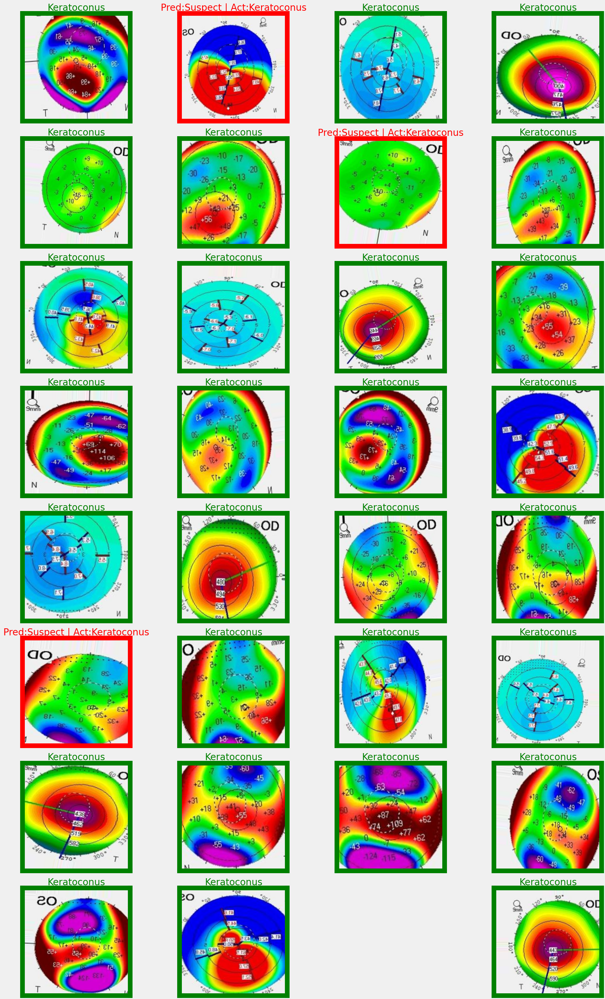

In [45]:
# Verify the predicted images for validation set
verifyPredictions('validation')

<div style = "color: Black; 
              display: fill;
              border-radius: 7px;
              background-color: #256d7c;">
    <h1 id = "verify-predictions-on-new-test-images"
        style = "padding: 18px; 
                 color: #f8e7b5;
                 font-size: 35px;
                 font-family: Cambria;
                 font-weight: bold;">Verify Predictions on New (Test) Images
        <a class="anchor-link" id="title" href="https://www.kaggle.com/code/charlesanjah/keratoconus-eye-disease-detection-using-cnn#verify-predictions-on-new-test-images">¶</a>
    </h1>
</div>

1/1 [==============================] - 0s 92ms/step
Batch prediction for test set: 0.40625



/tmp/ipykernel_32/882479022.py:41: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(8, 4, j+1)


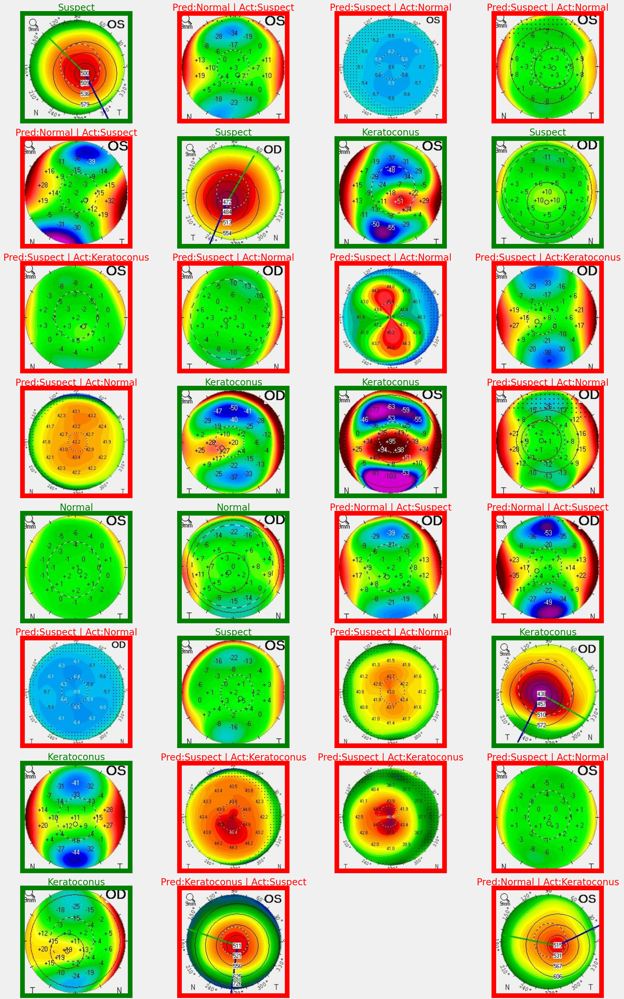

In [46]:
# Verify the predicted images for test set
verifyPredictions()